In [18]:
import os
os.getcwd()

'/zhome/07/f/169104/02516/02516-project1'

{'hotdog': 0, 'nothotdog': 1}

In [19]:
import torch
from src import train, models
import src
src.reload_all()

torch device selected: cuda


In [ ]:
model = models.BaselineNet()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

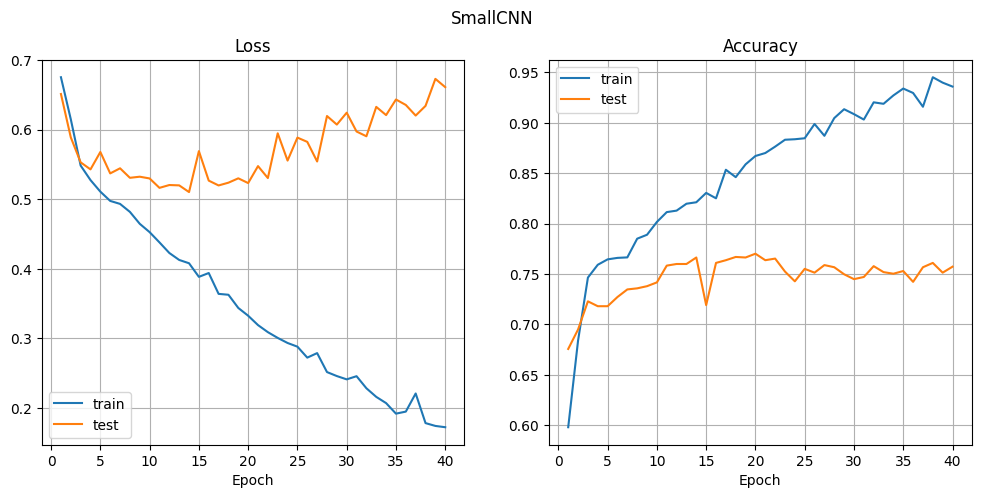

2025-09-20 18:39:03 | Epoch 40/40 | Loss train: 0.172 test: 0.661 | Acc train: 93.6% test: 75.7%


100%|██████████| 10/10 [00:17<00:00,  1.74s/epoch]


In [29]:
train.train(model, optimizer, num_epochs=10, plot=True, save=True, restart=False)

In [6]:
model = models.EfficientNet(baseline_level=4)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

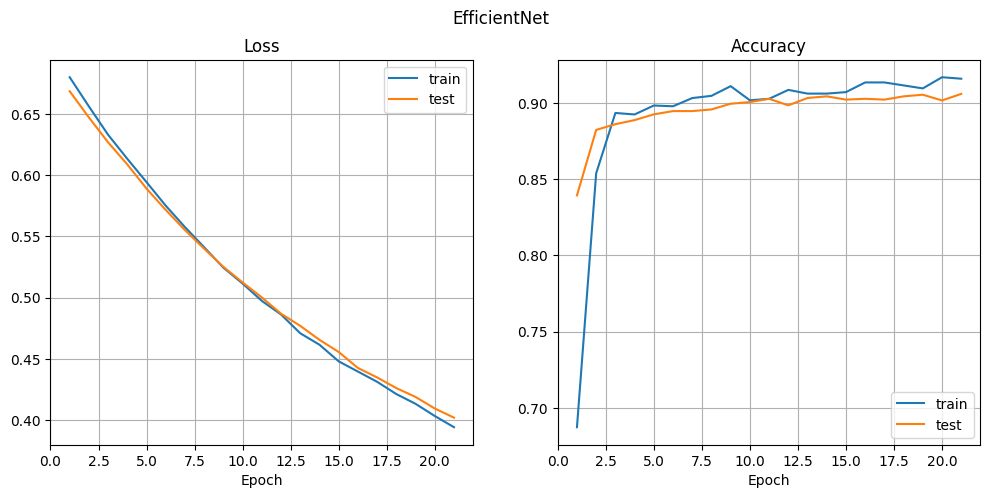

2025-09-24 15:05:41 | Epoch 21/21 | Loss train: 0.394 test: 0.402 | Acc train: 91.6% test: 90.6%


100%|██████████| 1/1 [00:24<00:00, 24.30s/epoch]


In [18]:
train.train(model, optimizer, num_epochs=1, plot=True, save=True, restart=False, transform=model.get_transforms())

torch device selected: cuda
tensor(0, device='cuda:0')
tensor(1, device='cuda:0')
tensor(1, device='cuda:0')
tensor(0, device='cuda:0')
tensor(1, device='cuda:0')


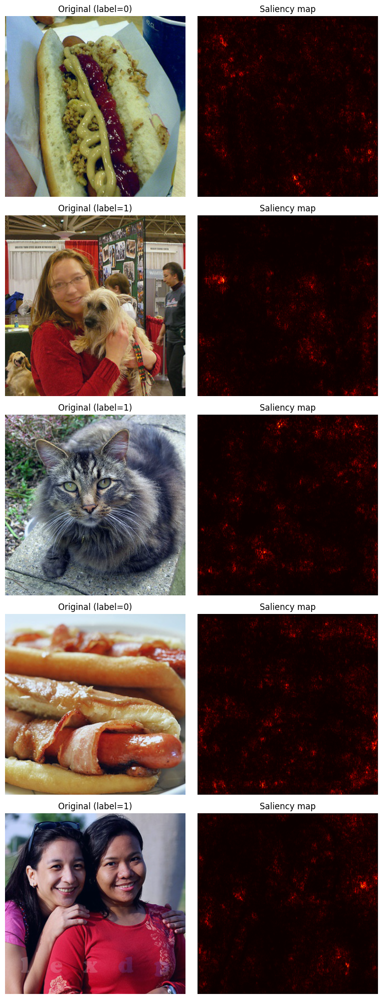

In [20]:
src.reload_all()
saliency.plot_saliency(model, transform=model.get_transforms())

In [12]:
asd = src.data.make_datasets_and_dataloaders()
len(asd[1])

1862

In [22]:
model = models.ConvNet()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
transform = 'aug'

In [24]:
sum(p.numel() for p in model.parameters())

2032897

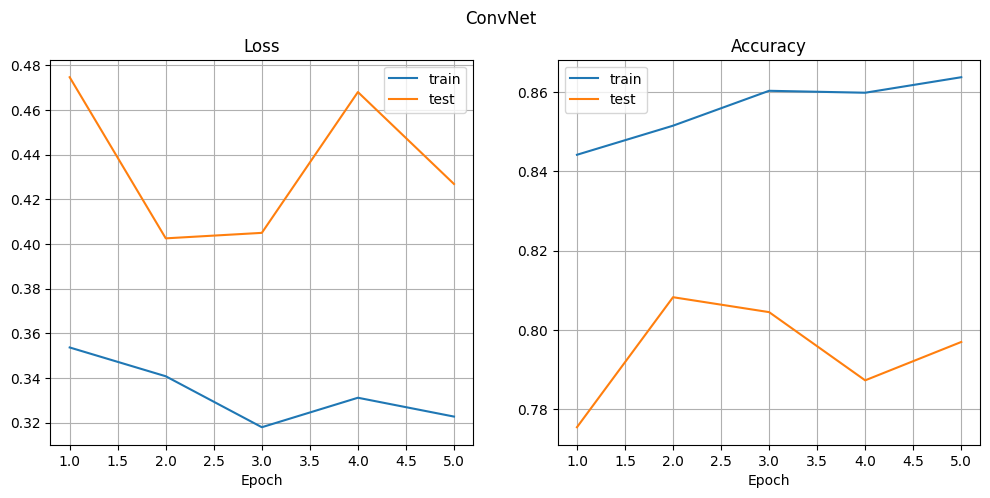

2025-09-24 16:43:10 | Epoch 5/5 | Loss train: 0.323 test: 0.427 | Acc train: 86.4% test: 79.7%


100%|██████████| 5/5 [00:50<00:00, 10.17s/epoch]


In [25]:
train.train(model, optimizer, num_epochs=5, plot=True, save=True, restart=False, transform=transform)

torch device selected: cuda


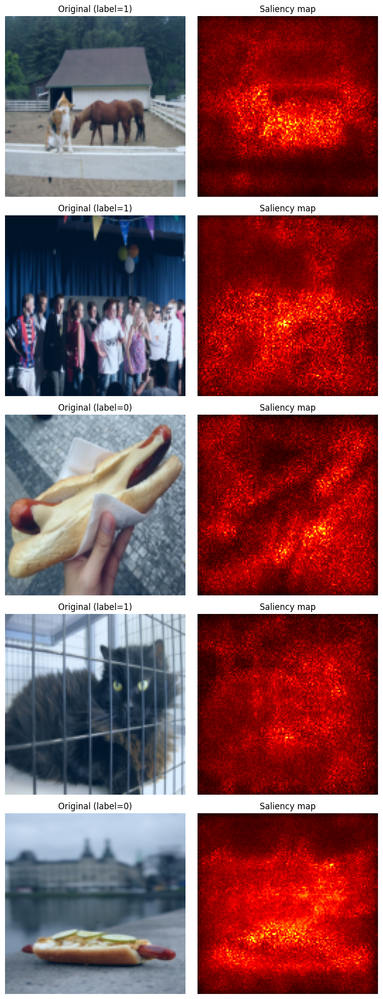

In [17]:
src.reload_all()
from src import saliency
saliency.plot_saliency(model, transform=transform, method="smoothgrad")

torch device selected: cuda


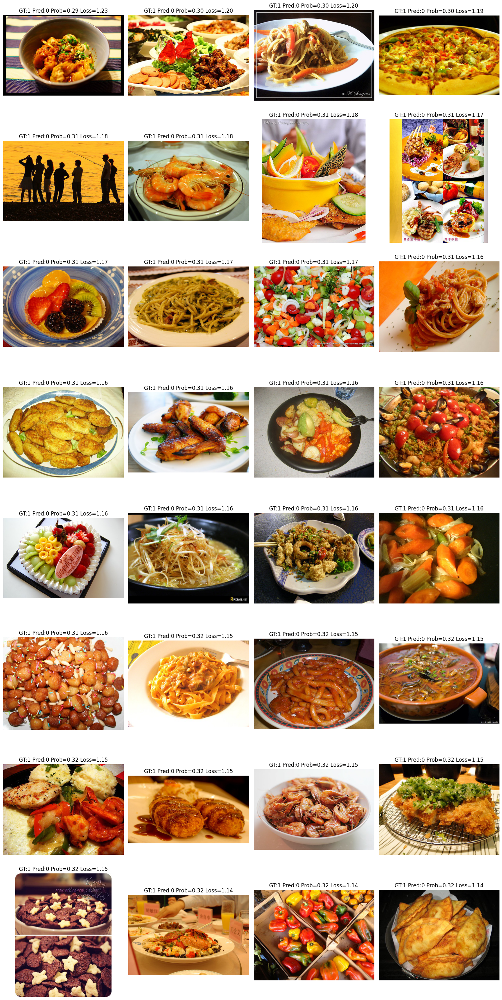

In [30]:
src.reload_all()
from src.train import show_hardest_mistakes
show_hardest_mistakes(model, n=32, transform=None, col_width=4)